In [50]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt

In [51]:
import seaborn as sns

In [52]:
!pip install pandas_profiling

In [53]:
import pandas_profiling

In [54]:
data = pd.read_csv('task2.txt', delimiter = "\t")
data.columns = ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', 'F']

In [6]:
data.head()

,1,2,3,4,5,6,7,8,9,10,F
0,0.968379,0.716820,0.678846,0.510049,0.545299,0.573692,0.817491,0.206636,0.880111,0.574187,17
1,0.468263,0.405603,0.320325,0.468084,0.100995,0.974407,0.300062,0.608356,0.050082,0.762011,12
2,0.776820,0.103740,0.373748,0.797782,0.906810,0.599069,0.626680,0.924705,0.632768,0.512663,16
3,0.407886,0.415357,0.101543,0.935160,0.444124,0.193607,0.656837,0.599929,0.868582,0.405406,20
4,0.538797,0.088621,0.886119,0.781848,0.401623,0.207652,0.946310,0.769453,0.827292,0.937183,15


In [7]:
data.tail()

,1,2,3,4,5,6,7,8,9,10,F
994,0.162843,0.435990,0.149917,0.665505,0.914584,0.630336,0.384881,0.407224,0.328757,0.994527,16
995,0.907179,0.737143,0.830932,0.799533,0.214602,0.800022,0.504500,0.494688,0.462960,0.276626,20
996,0.505830,0.163747,0.146821,0.667286,0.573377,0.585563,0.934153,0.312294,0.854859,0.607592,15
997,0.296363,0.720200,0.434514,0.755218,0.613471,0.940339,0.329413,0.763345,0.018250,0.474626,17
998,0.181283,0.966139,0.502668,0.985803,0.285397,0.963976,0.283293,0.879572,0.139573,0.523076,17


In [8]:
data.describe()

,1,2,3,4,5,6,7,8,9,10,F
count,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
mean,0.490827,0.499310,0.496888,0.503228,0.509042,0.513511,0.487020,0.498947,0.505185,0.499138,15.014014
std,0.293875,0.278568,0.297874,0.284238,0.283407,0.291201,0.288537,0.286087,0.282951,0.284215,4.773613
min,0.000188,0.000085,0.003110,0.001223,0.005314,0.000517,0.000493,0.000408,0.007883,0.000170,3.000000
25%,0.218936,0.262003,0.231736,0.268896,0.274559,0.255409,0.237670,0.256067,0.262155,0.249582,12.000000
50%,0.504846,0.500539,0.484541,0.503712,0.509213,0.527405,0.474573,0.501866,0.518658,0.509578,15.000000
75%,0.738493,0.733853,0.765198,0.747857,0.742668,0.767153,0.739001,0.737045,0.748219,0.742393,18.000000
max,0.999566,0.999959,0.998918,0.998785,0.998478,0.999059,0.999179,0.998646,0.998884,0.998819,29.000000


In [9]:
def Hres(p):
    print('p-value=%.3f' % (p))
    alpha = 0.05
    if p > alpha:
        print('Принять гипотезу')
    else:
        print('Отклонить гипотезу')

Гипотеза о нормальности распределения F

In [10]:
stat, p = scipy.stats.normaltest(data['F']) # Критерий согласия Пирсона
Hres(p)

p-value=0.018
Отклонить гипотезу


Гипотеза о независимости (коэф корр Пирсона)

In [11]:
corr, p = scipy.stats.pearsonr(data['4'], data['F'])
Hres(p)

p-value=0.000
Отклонить гипотезу


In [12]:
corr

0.5592400310808212

In [13]:
corr, p = scipy.stats.pearsonr(data['6'], data['F'])
Hres(p)

p-value=0.863
Принять гипотезу


In [14]:
corr, p = scipy.stats.pearsonr(data['1'], data['4'])
Hres(p)

p-value=0.620
Принять гипотезу


Гипотеза об одинаковом распределении

In [15]:
stat, p = scipy.stats.mannwhitneyu(data['1'], data['2'])
Hres(p)

p-value=0.251
Принять гипотезу


Кажется, некоторые переменные независимы, а некоторые не коррелируют с значением функции. Используем для разведочного анализа библиотеку pandas_profiling, чтобы быстро получить структурированный отчет и посмотреть на взаимосвязи переменных и значений функции 

In [16]:
pfr = pandas_profiling.ProfileReport(data)
pfr.to_file('DA_rep.html')
pfr

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Сделаем несколько заметок:\
1) В данных нет пропусков, всего 999 экземпляров \
2) Все значения переменных уравнения в наших данных уникальны. Они находятся в промежутке (0, 1). Значения функции находятся в промежутке (3, 29)\
3) Показатели (mean, max, etc) для входных переменных из выборки очень похожи\
3) Корреляционные матрицы говорят нам о наибольшей зависимости значения функции от переменных $x_1$, $x_2$, $x_3$, $x_4$, $x_5$, причем зависимость близится к линейной и монотонной. Тем не менее, коэффициенты не очень велики. Также, сами переменные скорее всего независимы

In [17]:
data.sample(5)

,1,2,3,4,5,6,7,8,9,10,F
916,0.889340,0.027879,0.115817,0.137038,0.970188,0.304573,0.554278,0.971421,0.469732,0.670910,10
979,0.723335,0.296608,0.412583,0.724314,0.507473,0.704799,0.681782,0.217111,0.541514,0.520093,17
498,0.703449,0.223294,0.998192,0.186078,0.075332,0.139632,0.007718,0.770631,0.746035,0.460650,12
769,0.146316,0.662514,0.157692,0.378059,0.227732,0.044155,0.897919,0.192526,0.903685,0.628650,11
489,0.285577,0.406229,0.097760,0.476596,0.885659,0.694885,0.216039,0.083931,0.976184,0.535873,16


Воспользуемся регрессором. Сравним при помощи коэффициента детерминации $R^2$ случайный лес и градиентный бустинг.\
Разделим нашу выборку на тренировочную и тестовую

In [55]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [56]:
tr_X, test_X, tr_Y, test_Y = train_test_split(data.drop(['F'], 1), data['F'], test_size = 0.3)

In [57]:
model = RandomForestRegressor(n_estimators=100, max_features ='sqrt')

In [58]:
model.fit(tr_X, tr_Y)
val_Y = [round(n) for n in model.predict(test_X)]
R2_y = r2_score(test_Y, val_Y)
R2_y

0.8389596110896156

Точность не очень высокая. Посмотим на важность входных переменных и сравним результаты с результатами второй модели

In [22]:
model.feature_importances_ * 100

array([20.9776152 , 17.38852145,  7.19990276, 31.95898701,  8.16573045,
        2.641944  ,  2.71378618,  2.67570516,  3.16724435,  3.11056344])

In [59]:
from catboost import CatBoostRegressor

In [60]:
model_2 = CatBoostRegressor()

In [61]:
model_2.fit(tr_X, tr_Y, verbose=False, plot=True)
val_Y = [round(n) for n in model_2.predict(test_X)]
R2_y = r2_score(test_Y, val_Y)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [26]:
R2_y

0.9781008763833993

Вторая модель оказалась точнее первой

In [27]:
a = model_2.feature_importances_
a

array([25.92598073, 22.75396632, 11.36889274, 29.0037458 ,  9.03829846,
        0.22548303,  0.56566432,  0.26889448,  0.30344453,  0.54562958])

Получается, наибольшую важность имеют переменные $x_1$, $x_2$, $x_3$, $x_4$, $x_5$, что соответствует матрице корреляций. Очень маленькую важность имеют переменные $x_6$, $x_7$, $x_8$, $x_9$, $x_{10}$, на общем фоне их вклад примерно одинаков. Выделяется важность переменных $x_1$, $x_2$, $x_4$

In [62]:
data_new = data.drop(columns=['6', '7', '8', '9', '10'])

In [63]:
data_new

,1,2,3,4,5,F
0,0.968379,0.716820,0.678846,0.510049,0.545299,17
1,0.468263,0.405603,0.320325,0.468084,0.100995,12
2,0.776820,0.103740,0.373748,0.797782,0.906810,16
3,0.407886,0.415357,0.101543,0.935160,0.444124,20
4,0.538797,0.088621,0.886119,0.781848,0.401623,15
...,...,...,...,...,...,...
994,0.162843,0.435990,0.149917,0.665505,0.914584,16
995,0.907179,0.737143,0.830932,0.799533,0.214602,20
996,0.505830,0.163747,0.146821,0.667286,0.573377,15
997,0.296363,0.720200,0.434514,0.755218,0.613471,17


In [64]:
Xtr, Xtest, Ytr, Ytest = train_test_split(data_new.drop(['F'], 1), data_new['F'], test_size = 0.3)

In [65]:
model_3 = CatBoostRegressor()

In [66]:
model_3.fit(Xtr, Ytr, verbose=False, plot=True)
val_Y = [round(n) for n in model_3.predict(Xtest)]
R2_y = r2_score(Ytest, val_Y)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [67]:
R2_y

0.9815902426337837

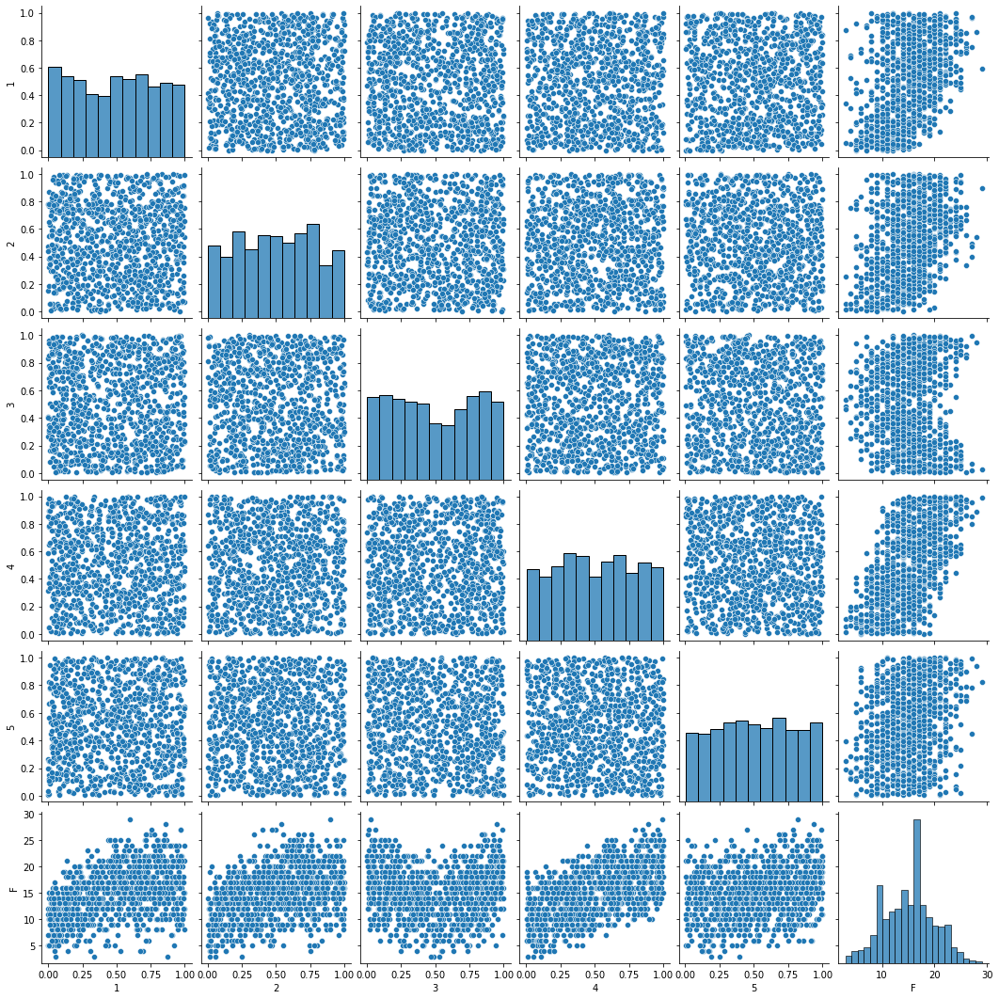

In [34]:
sns.pairplot(data_new)

Посмотрим, как еще можно улучшить точность. Проверим гипотезу о линейной независимости F и суммы переменных $x_1$, $x_2$, $x_4$, $x_5$

In [68]:
d_sum = data_new.drop(columns=['3', 'F']).sum(1)
corr, p = scipy.stats.pearsonr(d_sum, data_new['F'])
Hres(p)

p-value=0.000
Отклонить гипотезу


In [69]:
corr

0.8361598136408472

Коэффициент корреляции ~ 0.83. Добавим столбец суммы по этим переменным в наш датасет. Оценим теперь точность модели

In [70]:
data_sum = data_new
data_sum['sum'] = d_sum

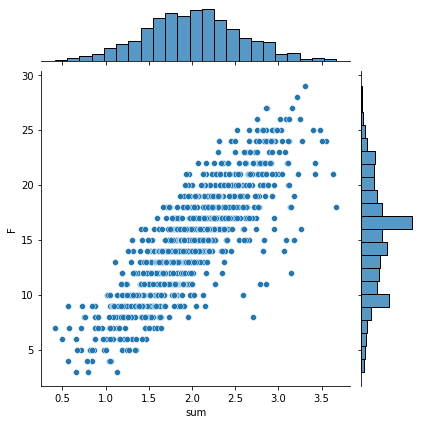

In [38]:
sns.jointplot(x='sum', y='F', data=data_sum, kind='scatter')

In [71]:
Xtr, Xtest, Ytr, Ytest = train_test_split(data_sum.drop(['F'], 1), data_sum['F'], test_size = 0.3)

In [72]:
model_4 = CatBoostRegressor()
model_4.fit(Xtr, Ytr, verbose=False, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [73]:
val_Y = [round(n) for n in model_4.predict(Xtest)]
R2_y = r2_score(Ytest, val_Y)
R2_y

0.9856811351169423

In [74]:
model_4.feature_importances_

array([16.67299613, 17.01071575, 18.48653802, 13.95144826,  2.61318537,
       31.26511647])

Точность выросла. Теперь сумма отобранных переменных имеет наибольшую важность.\
Воспользуемся линейной регрессией

In [76]:
import statsmodels.formula.api as sm

In [44]:
data.columns = ['Xa', 'Xb', 'Xc', 'Xd', 'Xe', 'Xf', 'Xg', 'Xh', 'Xi', 'Xj', 'F']

In [45]:
result = sm.ols(formula="F ~ Xa + Xb + Xc + Xd + Xe + Xf + Xg + Xh + Xi + Xj", data=data).fit()

In [77]:
print(result.params)

Intercept    1.006081
Xa           7.278693
Xb           6.675622
Xc          -0.252255
Xd           9.715556
Xe           5.152890
Xf           0.099468
Xg          -0.183151
Xh          -0.006598
Xi          -0.149855
Xj          -0.335712
dtype: float64


In [79]:
print(result.aic)
print(result.bic)

4634.37091522175
4688.345217786884


In [47]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      F   R-squared:                       0.740
Model:                            OLS   Adj. R-squared:                  0.737
Method:                 Least Squares   F-statistic:                     280.8
Date:                Sun, 28 Feb 2021   Prob (F-statistic):          1.22e-280
Time:                        04:09:26   Log-Likelihood:                -2306.2
No. Observations:                 999   AIC:                             4634.
Df Residuals:                     988   BIC:                             4688.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0061      0.441      2.280      0.0

Выбросим переменные, в доверительных интервалах которых содержится 0

In [48]:
data = data.drop(columns=['Xc', 'Xf', 'Xg', 'Xh', 'Xi', 'Xj'])
result_1 = sm.ols(formula="F ~ Xa + Xb + Xd + Xe", data=data).fit()
print(result_1.params)

Intercept    0.575052
Xa           7.287641
Xb           6.690857
Xd           9.719600
Xe           5.166581
dtype: float64


In [81]:
print(result_1.aic)
print(result_1.bic)

4625.942492159263
4650.476266052506


Вероятность первой модели минимизировать потерю информации в 0.02 раза выше, чем у второй

In [49]:
print(result_1.summary())

                            OLS Regression Results                            
Dep. Variable:                      F   R-squared:                       0.739
Model:                            OLS   Adj. R-squared:                  0.738
Method:                 Least Squares   F-statistic:                     702.9
Date:                Sun, 28 Feb 2021   Prob (F-statistic):          6.18e-288
Time:                        04:09:26   Log-Likelihood:                -2308.0
No. Observations:                 999   AIC:                             4626.
Df Residuals:                     994   BIC:                             4650.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.5751      0.293      1.965      0.0

Мы получили наилучшую несмещённую оценку в классе линейных оценок.
Доверительные интервалы небольшие, что хорошо.
Однако, точность не особенно высокая, как и можно было ожидать

Остановимся на этом

**Некоторые итоги**\
1) Переменные функции независимы, их значения одинаково распределены на (0, 1) (в нашей выборке они распределены равномерно)\
2) Для каждой из рассмотренных моделей получены степени важности переменных\
4) Переменная $x_4$ имеет наиболее линейный монотонный вклад в значение функции. Переменная $x_3$ не имеет заметной линейной корреляции с F, однако весомо влияет на ее значение\
5) Последние пять переменных почти не влияют на значение функции\
6) Градиентный бустинг победил всех. Полученная точность $R^2$ ~ 0.986